[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/EagleDad/DEEP-LEARNING-WITH-PYTORCH/blob/master/applications/kaggleCompetitionClassification/kaggleCompetitionClassification.ipynb)

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd /content/drive/MyDrive/DLPT/Project2

/content/drive/MyDrive/DLPT/Project2


In [ ]:
%mkdir -p data_root/training/training

In [ ]:
%mkdir -p data_root/validation/validation

In [ ]:
!pip install -q kaggle

In [ ]:
from google.colab import files
_ = files.upload()

Saving kaggle.json to kaggle.json


In [ ]:
!mkdir ~/.kaggle

In [ ]:
!cp kaggle.json ~/.kaggle/

In [ ]:
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets list

ref                                                           title                                            size  lastUpdated          downloadCount  voteCount  usabilityRating  
------------------------------------------------------------  ----------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
rabieelkharoua/students-performance-dataset                   📚 Students Performance Dataset 📚                 66KB  2024-06-12 23:09:20          25028        507  1.0              
waqi786/cars-dataset-2010-2020                                Cars Dataset (2010-2020)                         96KB  2024-07-23 05:49:46           1467         29  1.0              
marius2303/nissan-all-models-price-prediction-dataset         Nissan All Models Price Prediction Dataset      811KB  2024-07-27 11:50:10            788         24  1.0              
ihelon/coffee-sales                                           Coffee Sales                

In [ ]:
#! kaggle competitions download -c '10 Monkey Species'
!kaggle competitions download -c opencv-pytorch-classification-project-2

100% 1.29G/1.29G [00:25<00:00, 33.9MB/s]
100% 1.29G/1.29G [00:25<00:00, 55.5MB/s]


In [ ]:
!unzip -q 'opencv-pytorch-classification-project-2.zip'

In [ ]:
!rm -rf 'opencv-pytorch-classification-project-2.zip'

Split the dataset (80 : 20)

In [3]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split
import shutil

In [10]:
# Paths
csv_file = '/content/drive/MyDrive/DLPT/Project2/train.csv'
test_csv_file = '/content/drive/MyDrive/DLPT/Project2/test.csv'
source_dir = '/content/drive/MyDrive/DLPT/Project2/images/images'
train_dir = '/content/drive/MyDrive/DLPT/Project2/data_root/training/training'
val_dir = '/content/drive/MyDrive/DLPT/Project2/data_root/validation/validation'
test_dir = '/content/drive/MyDrive/DLPT/Project2/test/test'
base_dir = '/content/drive/MyDrive/DLPT/Project2/data_root/'
data_root = base_dir

In [ ]:
# Load the CSV file
data = pd.read_csv(csv_file)

In [ ]:
# Split the data
train_data, val_data = train_test_split(data, test_size=0.2, stratify=data['class'])

print("Data: ", data)
print("Trainig: ", train_data)
print("Validation: ", val_data)

Data:                          id       class
0     14278962987112149800     githeri
1     13190220095752321996       ugali
2     10431803432626641638  kachumbari
3      4222441716327528413     githeri
4      2547906925836120627      matoke
...                    ...         ...
6531   9491780363201908054      matoke
6532    938716700684692863     chapati
6533  12487998559342412135       ugali
6534   3466916091782561952  kachumbari
6535   4410319397208590457     chapati

[6536 rows x 2 columns]
Trainig:                          id       class
4551   2937366383558488773     chapati
1178  17530272069501959246  nyamachoma
1642   2069657870602803954   kukuchoma
1699   1098573203162321131     githeri
2997   3863261994188150700     githeri
...                    ...         ...
5903  12653237353722769106  nyamachoma
4748   6329826092957805988       ugali
641   15721740844179914369     githeri
6183  14251218500965074461   kukuchoma
1685   6047317205398611449     githeri

[5228 rows x 2 column

In [ ]:
# Function to create directories
def create_class_dirs(base_dir, classes):
    for class_name in classes:
        class_dir = os.path.join(base_dir, class_name)
        os.makedirs(class_dir, exist_ok=True)

In [ ]:
# Create the directories
classes = data['class'].unique()
create_class_dirs(train_dir, classes)
create_class_dirs(val_dir, classes)

In [ ]:
# Function to move images
def move_images(data, source_dir, target_base_dir):
    for _, row in data.iterrows():
        img_name = str(row['id'])
        class_name = row['class']
        src_path = os.path.join(source_dir, img_name + '.jpg')
        dest_dir = os.path.join(target_base_dir, class_name)
        shutil.move(src_path, dest_dir)

In [ ]:
# Function to move images
def move_test_images(data, source_dir, target_base_dir):
    for _, row in data.iterrows():
        img_name = str(row['id'])
        #class_name = row['class']
        src_path = os.path.join(source_dir, img_name + '.jpg')
        dest_dir = os.path.join(target_base_dir, img_name + '.jpg')
        shutil.move(src_path, dest_dir)

In [ ]:
# Move training images
move_images(train_data, source_dir, train_dir)

In [ ]:
# Move validation images
move_images(val_data, source_dir, val_dir)

In [ ]:
# Move trai.csv to data folder
shutil.move(csv_file, base_dir)

'/content/drive/MyDrive/DLPT/Project2/data_root/train.csv'

In [ ]:
# Load the CSV file
test_data = pd.read_csv(test_csv_file)

In [ ]:
print("Test Data: ", test_data)

Test Data:                          id
0      9156739011499789258
1      2049465964503133373
2      6446998501027132988
3      4194396063119815321
4      9018117998187006009
...                    ...
1633  18302448610371772604
1634  15920672464676076400
1635   3232020170382870007
1636   3094804487341098468
1637   5827342261332058667

[1638 rows x 1 columns]


In [ ]:
# Move test images
move_test_images(test_data, source_dir, test_dir)

In [5]:
!pip install pytorch-lightning

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [154]:
import torch
import torchvision

import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import MultiStepLR

from torchvision import transforms, datasets, models
#from torchvision.transforms import functional as F
import torch.nn.functional as F
# convert image tensor to PIL image and in range 0-255
from torchvision.transforms.functional import to_pil_image

from torch.optim.lr_scheduler import ReduceLROnPlateau

import pytorch_lightning as pl
# Importing EarlyStopping callback
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint

# Use Module API to track and compute metrics automatically
from torchmetrics import MeanMetric
from torchmetrics.classification import MulticlassAccuracy

import matplotlib.pyplot as plt

from operator import itemgetter

from dataclasses import dataclass

import random
import csv

import os

import ssl
import itertools

import numpy as np
import pandas as pd

from PIL import Image

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, confusion_matrix, ConfusionMatrixDisplay

# filter UserWarning
import warnings
warnings.filterwarnings('ignore', category=UserWarning)

# **Change working directory to store all data in GitHub for submission**

In [157]:
%cd /content/drive/MyDrive/Github/DEEP-LEARNING-WITH-PYTORCH/applications/kaggleCompetitionClassification

/content/drive/MyDrive/DLPT/Project2


In [158]:
os.chdir('/content/drive/MyDrive/Github/DEEP-LEARNING-WITH-PYTORCH/applications/kaggleCompetitionClassification')

# <font style="color:blue">Project 2: Kaggle Competition - Classification</font>

#### Maximum Points: 100

<div>
    <table>
        <tr><td><h3>Sr. no.</h3></td> <td><h3>Section</h3></td> <td><h3>Points</h3></td> </tr>
        <tr><td><h3>1</h3></td> <td><h3>Data Loader</h3></td> <td><h3>10</h3></td> </tr>
        <tr><td><h3>2</h3></td> <td><h3>Configuration</h3></td> <td><h3>5</h3></td> </tr>
        <tr><td><h3>3</h3></td> <td><h3>Evaluation Metric</h3></td> <td><h3>10</h3></td> </tr>
        <tr><td><h3>4</h3></td> <td><h3>Train and Validation</h3></td> <td><h3>5</h3></td> </tr>
        <tr><td><h3>5</h3></td> <td><h3>Model</h3></td> <td><h3>5</h3></td> </tr>
        <tr><td><h3>6</h3></td> <td><h3>Utils</h3></td> <td><h3>5</h3></td> </tr>
        <tr><td><h3>7</h3></td> <td><h3>Experiment</h3></td><td><h3>5</h3></td> </tr>
        <tr><td><h3>8</h3></td> <td><h3>TensorBoard Log</h3></td> <td><h3>5</h3></td> </tr>
        <tr><td><h3>9</h3></td> <td><h3>Kaggle Profile Link</h3></td> <td><h3>50</h3></td> </tr>
    </table>
</div>


## <font style="color:green">1. Data Loader [10 Points]</font>

In this section, you have to write a class or methods, which will be used to get training and validation data loader.

You need to write a custom dataset class to load data.

**Note; There is   no separate validation data. , You will thus have to create your own validation set, by dividing the train data into train and validation data. Usually, we do 80:20 ratio for train and validation, respectively.**


For example:

```python
class KenyanFood13Dataset(Dataset):
    """
    
    """
    
    def __init__(self, *args):
    ....
    ...
    
    def __getitem__(self, idx):
    ...
    ...
    
    
```

```
def get_data(args1, *agrs):
    ....
    ....
    return train_loader, test_loader
```

In [17]:
%matplotlib inline

In [18]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [107]:
def image_preprocess_transforms():

    preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor()
        ])

    return preprocess

In [108]:
def image_common_transforms(mean=(0.5774, 0.4624, 0.3455), std=(0.2696, 0.2737, 0.2826)):
    preprocess = image_preprocess_transforms()

    common_transforms = transforms.Compose([
        preprocess,
        transforms.Normalize(mean, std)
    ])

    return common_transforms

In [109]:
def data_augmentation_preprocess(mean=(0.5774, 0.4624, 0.3455), std=(0.2696, 0.2737, 0.2826)):

  commonTransforms = image_common_transforms(mean, std)

  augmentation_transforms = transforms.Compose([
        transforms.RandomChoice([
            transforms.RandomResizedCrop(224),  # Randomly crop the image to 224x224
            transforms.RandomHorizontalFlip(),  # Randomly flip the image horizontally
            transforms.RandomRotation(90),      # Randomly rotate the image by up to 20 degrees
            transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),  # Randomly change the brightness, contrast, saturation, and hue
            transforms.RandomVerticalFlip(),
        ]),
        commonTransforms
    ])

  return augmentation_transforms

  #augmentation_transforms = transforms.Compose([
  #      transforms.RandomResizedCrop(256),
  #      transforms.ColorJitter(
  #      brightness=0.5, contrast=0.5, saturation=0.5, hue=0.3),
  #      transforms.RandomHorizontalFlip(),
  #      transforms.RandomVerticalFlip(),
  #      transforms.RandomRotation(90),
  #      transforms.RandomGrayscale(p=0.1),
  #      common_transforms])

  #return augmentation_transforms

In [110]:
def get_mean_std(data_root, num_workers=4):

  data_module = KenyanFood13DataModule(
    batch_size = 64,
    num_workers = 8
  )
  data_module.setup()

  loader = data_module.mean_std_dataloader()

  batch_mean = torch.zeros(3)
  batch_mean_sqrd = torch.zeros(3)

  for batch_data, _ in loader:
      batch_mean += batch_data.mean(dim=(0, 2, 3)) # E[batch_i]
      batch_mean_sqrd += (batch_data ** 2).mean(dim=(0, 2, 3)) #  E[batch_i**2]

  # E[dataset] = E[E[batch_1], E[batch_2], ...]
  mean = batch_mean / len(loader)

  # var[X] = E[X**2] - E[X]**2

  # E[X**2] = E[E[batch_1**2], E[batch_2**2], ...]
  # E[X]**2 = E[E[batch_1], E[batch_2], ...] ** 2

  var = (batch_mean_sqrd / len(loader)) - (mean ** 2)

  std = var ** 0.5
  print('mean: {}, std: {}'.format(mean, std))

  return mean, std

In [106]:
mean, std = get_mean_std(data_root)

mean: tensor([0.5774, 0.4624, 0.3455]), std: tensor([0.2696, 0.2737, 0.2826])


Shortcut for testing

In [111]:
npMean = [0.5774, 0.4624, 0.3455]
mean = torch.tensor(npMean)

npStd = [0.2696, 0.2737, 0.2826]
std = torch.tensor(npStd)

print('mean: {}, std: {}'.format(mean, std))

mean: tensor([0.5774, 0.4624, 0.3455]), std: tensor([0.2696, 0.2737, 0.2826])


In [112]:
class KenyanFood13DataModule(pl.LightningDataModule):

  def __init__(self, batch_size, num_workers, mean=(0.5774, 0.4624, 0.3455), std=(0.2696, 0.2737, 0.2826)):

    super().__init__()

    self.batch_size = batch_size
    self.num_workers = num_workers
    self.data_root = data_root

    preprocess = image_preprocess_transforms()

    self.common_transforms = image_common_transforms(mean, std)

    self.aug_transforms = data_augmentation_preprocess(mean, std)

    self.mean_std_transform = image_preprocess_transforms()

  def prepare_data(self):

    # Note: We have prepared the dataset initialy and stored in on GoogleDrive
    # to not have to download and spilt with each run
    print("Preparing KenyanFood13 dataset")
    print("Preparation completed.")

  def setup(self, stage = None):

    train_data_path = os.path.join(self.data_root, "training", "training")
    val_data_path = os.path.join(self.data_root, "validation", "validation")

    self.train_dataset = datasets.ImageFolder(
      root = train_data_path,
      transform = self.aug_transforms
    )

    self.mean_std_dataset = datasets.ImageFolder(
      root = train_data_path,
      transform = self.mean_std_transform
    )

    self.val_dataset = datasets.ImageFolder(
      root = val_data_path,
      transform = self.common_transforms
    )

  def train_dataloader(self):

    # train loader
    train_loader = torch.utils.data.DataLoader(
      self.train_dataset,
      batch_size = self.batch_size,
      shuffle = True,
      num_workers = self.num_workers,
    )

    return train_loader

  def mean_std_dataloader(self):

    # mean std loader
    mean_std_loader = torch.utils.data.DataLoader(
      self.mean_std_dataset,
      batch_size = self.batch_size,
      shuffle = False,
      num_workers = self.num_workers,
    )

    return mean_std_loader

  def val_dataloader(self):

    # validation loader
    test_loader = torch.utils.data.DataLoader(
      self.val_dataset,
      batch_size = self.batch_size,
      shuffle = False,
      num_workers = self.num_workers,
    )

    return test_loader

Length of the dataset: 5228
torch.Size([3, 224, 224])
0
Label: 0, common name: bhaji


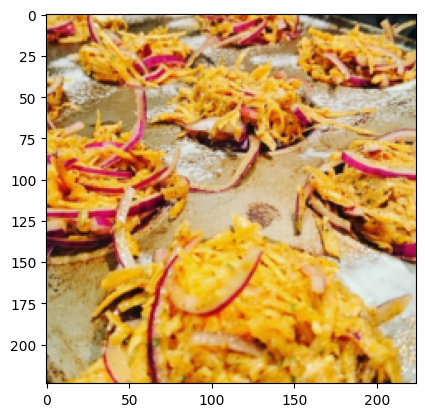

In [113]:
train_dataset = KenyanFood13DataModule(
    batch_size = 64,
    num_workers = 8
  )
train_dataset.setup()

print('Length of the dataset: {}'.format(len(train_dataset.train_dataset)))

img, trgt = train_dataset.mean_std_dataset[0]

idx_to_class_name = {j: i for i, j in train_dataset.train_dataset.class_to_idx.items()}

print(img.shape)
print(trgt)

img = to_pil_image(img)

print('Label: {}, common name: {}'.format(trgt, idx_to_class_name[trgt]))

plt.imshow(img)
plt.show()

## <font style="color:green">2. Configuration [5 Points]</font>

**Define your configuration here.**

For example:


```python
@dataclass
class TrainingConfiguration:
    '''
    Describes configuration of the training process
    '''
    batch_size: int = 10
    epochs_count: int = 50  
    init_learning_rate: float = 0.1  # initial learning rate for lr scheduler
    log_interval: int = 5  
    test_interval: int = 1  
    data_root: str = "/kaggle/input/opencv-pytorch-classification-project-2/"
    num_workers: int = 2  
    device: str = 'cuda'  
    
```

In [114]:
torch.set_float32_matmul_precision('high')

In [115]:
@dataclass(frozen=True)
class TrainingConfiguration:
    '''
    Describes configuration of the training process
    '''
    batch_size: int = 64
    epochs_count: int = 50
    learning_rate: float = 0.01  # initial learning rate for lr scheduler
    log_interval: int = 5
    test_interval: int = 1
    data_root: str = f"data_root"
    num_workers: int = 10 # 2 is reccomended by colab. Higher numbers result in a warning
    device: str = 'cuda'
    model_name: str = f"resnet50"
    weights: str = "DEFAULT"
    fine_tune_start: int = 3
    precision: str = "16-mixed"

In [116]:
@dataclass(frozen=True)
class DataConfiguration:
    data_root: str = f"data_root"
    num_workers: int = 8
    batch_size: int = 128
    num_classes = 13

In [117]:
@dataclass
class SystemConfiguration:
    '''
    Describes the common system setting needed for reproducible training
    '''
    seed: int = 21  # seed number to set the state of all random number generators
    cudnn_benchmark_enabled: bool = True  # enable CuDNN benchmark for the sake of performance
    cudnn_deterministic: bool = True  # make cudnn deterministic (reproducible training)

In [118]:
data_config = DataConfiguration()
train_config = TrainingConfiguration()
sys_config = SystemConfiguration()

## <font style="color:green">3. Evaluation Metric [10 Points]</font>

**Define methods or classes that will be used in model evaluation. For example, accuracy, f1-score etc.**

In [119]:
def plot_confusion_matrix(cm,
                          classes,
                          normalise = False,
                          title = 'Confusion matrix',
                          cmap = plt.cm.Reds):

    plt.imshow(cm, interpolation = 'nearest', cmap = cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation = 45)
    plt.yticks(tick_marks, classes)

    if normalise:
        cm = cm.astype('float') / cm.sum(axis = 1)[:, np.newaxis]
        cm = cm.round(2)

    thresh = cm.max() / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment = "center",
                 color = "white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [120]:
# Generating the classification report for checking the model's performance on the test set of the same dataset
def generate_classification_report(targetNames, predictedNames):
  cr = classification_report(targetNames, predictedNames)
  print("CLASSIFICATION REPORT")
  print(cr)
  print("")
  return cr

In [121]:
# Generating confusion matrix to see where the model is misclassifying
def generate_confusion_matrix(targetNames, predictedNames):
  cm = confusion_matrix(targetNames, predictedNames)
  print("Confusion Matrix")
  print( cm )
  print("")
  return cm

In [122]:
#
# This methode is used to calculate and viualize a sample set to get an idea
# about the results
#
def validate_prediction(model, data_module, ckpt_path):
    random.seed(1)

    # load model from checkpoint
    ckpt_model = TransferLearningWithResNet.load_from_checkpoint(ckpt_path)
    # freeze model for inference
    ckpt_model.freeze()

    # run model in evaluation mode
    ckpt_model.eval()

    # get val_dataloader for data_module
    val_data = data_module.val_dataloader()

    idx_to_class = {j: i for i, j in data_module.val_dataset.class_to_idx.items()}

    imgs = []
    preds = []
    probs = []
    targets = []

    device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
    ckpt_model.to(device)

    for data, target in val_data:

        with torch.no_grad():
            output = ckpt_model(data.to(device))

        # get probability score using softmax
        prob = F.softmax(output, dim=1)

        # get the max probability
        pred_prob = prob.data.max(dim=1)[0]

        # get the index of the max probability
        pred_index = prob.data.max(dim=1)[1]
        # pass the loaded model
        pred = pred_index.cpu().tolist()
        prob = pred_prob.cpu().tolist()

        imgs.extend([np.asarray(to_pil_image(image)) for image in denormalize(data)])

        npTarget = target.numpy()
        for tgt in npTarget:
          targets.append(tgt)

        preds.extend(pred)
        probs.extend(prob)

    # randomly select 6 images fom the first batch
    random_6 = random.sample(list(zip(imgs, preds, probs)), 6)

    plt.figure(figsize=(12, 15))

    for idx, (img, pred, prob) in enumerate(random_6, 1):
        img = np.array(img).reshape(224, 224, 3)
        plt.subplot(3, 2, idx)
        plt.imshow(img)
        plt.title(f"Prediction: {idx_to_class[pred]}, Prob: {prob:.2f}")
        plt.axis("off")

    plt.show()

    print("PREDICTIONS")
    print(preds)
    print("")
    print("PROBABILITIES")
    print(probs)
    print("")
    print("INDEX TO CLASS")
    print(idx_to_class)
    print("")
    print("TARGETS")
    print(targets)
    print("")

    targetNames = []
    predictionNames = []

    for tgt in targets:
      targetNames.append(idx_to_class[tgt])

    for pred in preds:
      predictionNames.append(idx_to_class[pred])

    print("TARGET NAMES")
    print(targetNames)
    print("")
    print("PREDICTED NAMES")
    print(predictionNames)
    print("")

    cr = generate_classification_report(targetNames, predictionNames)

    cm = generate_confusion_matrix(targetNames, predictionNames)

    # Printing the confusion matrix (not normalised)
    np.set_printoptions(precision = 2)
    fig1 = plt.figure(figsize = (7, 6))
    plot_confusion_matrix(cm,
                          classes = np.unique(targetNames),
                          title = 'Confusion matrix without normalisation')

    # Printing the confusion matrix (normalised)
    fig2 = plt.figure(figsize = (7, 6))
    plot_confusion_matrix(cm,
                          classes = np.unique(targetNames),
                          normalise = True,
                          title = 'Confusion matrix with normalisation')

    return

In [155]:
#
# This methode is used to calculate the final result for the submission
# All test images from the test folder are predicted.
#
def test_prediction(model, data_module, ckpt_path):
    random.seed(1)

    # load model from checkpoint
    ckpt_model = TransferLearningWithResNet.load_from_checkpoint(ckpt_path)
    # freeze model for inference
    ckpt_model.freeze()

    # run model in evaluation mode
    ckpt_model.eval()

    idx_to_class = {j: i for i, j in data_module.val_dataset.class_to_idx.items()}

    imgs = []
    preds = []
    probs = []
    imageNames = []

    device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
    ckpt_model.to(device)

    common_transforms = image_common_transforms(mean, std)

    for imageName in os.listdir(test_dir):

        imagePathAndName = os.path.join(test_dir, imageName)

        img = Image.open(imagePathAndName)

        # Apply the transform to the input image
        img_t = common_transforms(img)

        # Create a mini-batch
        data = torch.unsqueeze(img_t, 0)

        with torch.no_grad():
            output = ckpt_model(data.to(device))

        # get probability score using softmax
        prob = F.softmax(output, dim=1)

        # get the max probability
        pred_prob = prob.data.max(dim=1)[0]

        # get the index of the max probability
        pred_index = prob.data.max(dim=1)[1]
        # pass the loaded model
        pred = pred_index.cpu().tolist()
        prob = pred_prob.cpu().tolist()

        imgs.extend([np.asarray(to_pil_image(image)) for image in denormalize(data)])

        imageNames.append(imageName.split('.')[0])
        preds.extend(pred)
        probs.extend(prob)

    print("PREDICTIONS")
    print(preds)
    print("")
    print("PROBABILITIES")
    print(probs)
    print("")
    print("INDEX TO CLASS")
    print(idx_to_class)
    print("")
    print("IMAGE NAMES")
    print(imageNames)
    print("")

    predictionNames = []

    for pred in preds:
      predictionNames.append(idx_to_class[pred])

    print("PREDICTED NAMES")
    print(predictionNames)
    print("")

    # randomly select 6 images fom the first batch
    random_6 = random.sample(list(zip(imgs, preds, probs)), 6)

    plt.figure(figsize=(12, 15))

    for idx, (img, pred, prob) in enumerate(random_6, 1):
        img = np.array(img).reshape(224, 224, 3)
        plt.subplot(3, 2, idx)
        plt.imshow(img)
        plt.title(f"Prediction: {idx_to_class[pred]}, Prob: {prob:.2f}")
        plt.axis("off")

    plt.show()

    submission_file_path_and_name = '/content/drive/MyDrive/DLPT/Project2/submission.csv'

    # field names
    fields = ['id', 'class']

    with open(submission_file_path_and_name, 'w') as csvfile:

      # creating a csv writer object
      csvwriter = csv.writer(csvfile)

      # writing the fields
      csvwriter.writerow(fields)

      # writing the data rows
      for i in range(len(imageNames)):
        csvwriter.writerow([imageNames[i], predictionNames[i]])

    print(f"Data has been written to {submission_file_path_and_name}")

    #kaggle competitions submit -c opencv-pytorch-classification-project-2 -f submission.csv -m "Message"

    return

## <font style="color:green">4. Train and Validation [5 Points]</font>


**Write the methods or classes to be used for training and validation.**

In [124]:
def training_validation():

  pl.seed_everything(sys_config.seed, workers=True)

  # init model

  model = TransferLearningWithResNet(
    resnet_model_name = train_config.model_name,
    weights = train_config.weights,
    fine_tune_start = train_config.fine_tune_start,
    num_classes = data_config.num_classes,
    learning_rate = train_config.learning_rate,
  )

  data_module = KenyanFood13DataModule(
    batch_size = data_config.batch_size,
    num_workers = data_config.num_workers
  )

  checkpoint_callback = ModelCheckpoint(
    monitor = 'valid/acc',
    mode = "max",
    filename = 'transfer_learning-resnet50-epoch-{epoch:02d}',
    auto_insert_metric_name = False,
    save_weights_only = True
  )

  early_stopping_callback = EarlyStopping(
      monitor = "valid/loss"
  )

  print("Max epochs: ", train_config.epochs_count)

  # most basic trainer, uses good defaults
  trainer = pl.Trainer(
    accelerator = "auto", #'auto'
    devices = "auto",
    strategy = "auto",
    max_steps = -1,
    max_epochs = train_config.epochs_count,
    precision = train_config.precision,
    callbacks = [
      early_stopping_callback,
      checkpoint_callback
    ]
  )

  trainer.fit(model, data_module)

  return model, data_module, checkpoint_callback

## <font style="color:green">5. Model [5 Points]</font>

**Define your model in this section.**

**You are allowed to use any pre-trained model.**

In [125]:
# Print the models available in torchvision
print(dir(models))

['AlexNet', 'AlexNet_Weights', 'ConvNeXt', 'ConvNeXt_Base_Weights', 'ConvNeXt_Large_Weights', 'ConvNeXt_Small_Weights', 'ConvNeXt_Tiny_Weights', 'DenseNet', 'DenseNet121_Weights', 'DenseNet161_Weights', 'DenseNet169_Weights', 'DenseNet201_Weights', 'EfficientNet', 'EfficientNet_B0_Weights', 'EfficientNet_B1_Weights', 'EfficientNet_B2_Weights', 'EfficientNet_B3_Weights', 'EfficientNet_B4_Weights', 'EfficientNet_B5_Weights', 'EfficientNet_B6_Weights', 'EfficientNet_B7_Weights', 'EfficientNet_V2_L_Weights', 'EfficientNet_V2_M_Weights', 'EfficientNet_V2_S_Weights', 'GoogLeNet', 'GoogLeNetOutputs', 'GoogLeNet_Weights', 'Inception3', 'InceptionOutputs', 'Inception_V3_Weights', 'MNASNet', 'MNASNet0_5_Weights', 'MNASNet0_75_Weights', 'MNASNet1_0_Weights', 'MNASNet1_3_Weights', 'MaxVit', 'MaxVit_T_Weights', 'MobileNetV2', 'MobileNetV3', 'MobileNet_V2_Weights', 'MobileNet_V3_Large_Weights', 'MobileNet_V3_Small_Weights', 'RegNet', 'RegNet_X_16GF_Weights', 'RegNet_X_1_6GF_Weights', 'RegNet_X_32GF_

In [159]:
class TransferLearningWithResNet(pl.LightningModule):
    def __init__(
        self,
        resnet_model_name="resnet50",
        weights="DEFAULT",
        fine_tune_start=1,
        learning_rate=0.01,
        num_classes=13,
    ):
        super().__init__()

        self.save_hyperparameters()

        resnet = getattr(models, self.hparams.resnet_model_name)(
            weights=self.hparams.weights
        )

        if self.hparams.weights:
            for param in resnet.parameters():
                param.requires_grad = False

        if self.hparams.weights and self.hparams.fine_tune_start <= 1:
            for param in resnet.layer1.parameters():
                param.requires_grad = True

        if self.hparams.weights and self.hparams.fine_tune_start <= 2:
            for param in resnet.layer2.parameters():
                param.requires_grad = True

        if self.hparams.weights and self.hparams.fine_tune_start <= 3:
            for param in resnet.layer3.parameters():
                param.requires_grad = True

        if self.hparams.weights and self.hparams.fine_tune_start <= 4:
            for param in resnet.layer4.parameters():
                param.requires_grad = True

        last_layer_in = resnet.fc.in_features
        resnet.fc = nn.Linear(last_layer_in, self.hparams.num_classes)

        self.resnet = resnet

        # Initializing the required metric objects.
        self.mean_train_loss = MeanMetric()
        self.mean_train_acc = MulticlassAccuracy(num_classes=self.hparams.num_classes, average="micro")
        self.mean_valid_loss = MeanMetric()
        self.mean_valid_acc = MulticlassAccuracy(num_classes=self.hparams.num_classes, average="micro")

    def forward(self, x):

        return self.resnet(x)


    def training_step(self, batch, *args, **kwargs):

        # get data and labels from batch
        data, target = batch

        # get prediction
        output = self(data)

        # calculate batch loss
        loss = F.cross_entropy(output, target)

        # Batch Predictions.
        pred_batch = output.detach().argmax(dim=1)

        self.mean_train_loss(loss, weight=data.shape[0])
        self.mean_train_acc(pred_batch, target)

        # Arguments such as on_epoch, on_step and logger are set automatically depending on
        # hook methods it's been called from
        self.log("train/batch_loss", self.mean_train_loss, prog_bar=True, logger=True)

        # logging and adding current batch_acc to progress_bar
        self.log("train/batch_acc", self.mean_train_acc, prog_bar=True, logger=True)

        return loss


    def on_train_epoch_end(self):
        """Calculate epoch level metrics for the train set"""

        self.log("train/loss", self.mean_train_loss, prog_bar=True, logger=True)
        self.log("train/acc", self.mean_train_acc, prog_bar=True, logger=True)
        self.log("step", self.current_epoch, logger=True)


    def validation_step(self, batch, *args, **kwargs):

        # get data and labels from batch
        data, target = batch

        # get prediction
        output = self(data)

        # calculate loss
        loss = F.cross_entropy(output, target)

        # Batch Predictions.
        pred_batch = output.argmax(dim=1)

        # Update logs.
        self.mean_valid_loss(loss, weight=data.shape[0])
        self.mean_valid_acc(pred_batch, target)


    def on_validation_epoch_end(self):
        """Calculate epoch level metrics for the validation set"""

        self.log("valid/loss", self.mean_valid_loss, prog_bar=True, logger=True)
        self.log("valid/acc", self.mean_valid_acc, prog_bar=True, logger=True)
        self.log("step", self.current_epoch, logger=True)

    def configure_optimizers(self):
        optimizer = torch.optim.SGD(self.parameters(), lr=self.hparams.learning_rate)

        # Define the multiplicative factor for the scheduler
        decay_rate = 0.5
        lmbda = lambda epoch: 1/(1 + decay_rate * epoch)

        # Create the MultiplicativeLR scheduler
        scheduler = torch.optim.lr_scheduler.MultiplicativeLR(optimizer, lr_lambda=lmbda)

        # Return both the optimizer and the scheduler
        return {
            'optimizer': optimizer,
            'lr_scheduler': {
                'scheduler': scheduler,
                'interval': 'epoch',  # 'epoch' is common, could also be 'step'
                'frequency': 1,       # How often to apply the scheduler
            }
        }


        #return torch.optim.SGD(self.parameters(), lr=self.hparams.learning_rate)

    def training_epoch_end(self, outputs):
      # Log the learning rate
      lr = self.trainer.optimizers[0].param_groups[0]['lr']
      self.log('learning_rate', lr, prog_bar=True, logger=True)

## <font style="color:green">6. Utils [5 Points]</font>

**Define those methods or classes, which have  not been covered in the above sections.**

In [137]:
def load_model(checkpoint):

  pl.seed_everything(sys_config.seed, workers=True)

  data_module = KenyanFood13DataModule(
    batch_size = data_config.batch_size,
    num_workers = data_config.num_workers
  )

  checkpoint_callback = ModelCheckpoint(
    monitor = 'valid/acc',
    mode = "max",
    filename = 'transfer_learning-resnet50-epoch-{epoch:02d}',
    auto_insert_metric_name = False,
    save_weights_only = True
  )

  early_stopping_callback = EarlyStopping(
      monitor = "valid/loss"
  )

  # most basic trainer, uses good defaults
  trainer = pl.Trainer(
    accelerator = "auto",
    devices = "auto",
    strategy = "auto",
    max_epochs = train_config.epochs_count,
    precision = train_config.precision,
    callbacks = [
      early_stopping_callback,
      checkpoint_callback
    ]
  )

  model = TransferLearningWithResNet.load_from_checkpoint(checkpoint)

  # disable randomness, dropout, etc...
  model.eval()

  return model, data_module, checkpoint_callback

In [135]:
def denormalize(tensors):
    """Denormalizes image tensors back to range [0.0, 1.0]"""

    #mean = torch.Tensor([0.485, 0.456, 0.406])
    #std = torch.Tensor([0.229, 0.224, 0.225])

    tensors = tensors.clone()
    for c in range(3):
        tensors[:, c, :, :].mul_(std[c]).add_(mean[c])

    return torch.clamp(tensors.cpu(), 0.0, 1.0)

In [129]:
# To reload tensorBoard
%load_ext tensorboard

#%cd /content/drive/MyDrive/Github/DEEP-LEARNING-WITH-PYTORCH/applications/kaggleCompetitionClassification

# logs folder path
%tensorboard --logdir=lightning_logs

Output hidden; open in https://colab.research.google.com to view.

In [130]:
def main():
  '''Run the experiment
  '''
  return training_validation()

## <font style="color:green">7. Experiment [5 Points]</font>

**Choose your optimizer and LR-scheduler and use the above methods and classes to train your model.**

In [138]:
doFit = False

if __name__ == '__main__':

  if doFit:
    model, data_module, checkpoint_callback = main()
  else:
    ckpt_path = '/content/drive/MyDrive/DLPT/Project2/lightning_logs/version_3/checkpoints/transfer_learning-resnet50-epoch-41.ckpt'
    model, data_module, checkpoint_callback = load_model(ckpt_path)
    data_module.setup()


INFO:lightning_fabric.utilities.seed:Seed set to 21
INFO:pytorch_lightning.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 140MB/s]


In [ ]:
# get checkpoints of the latest run
ckpt_path = checkpoint_callback.best_model_path
print('The latest model path: {}'.format(ckpt_path))

The latest model path: /content/drive/MyDrive/DLPT/Project2/lightning_logs/version_3/checkpoints/transfer_learning-resnet50-epoch-41.ckpt


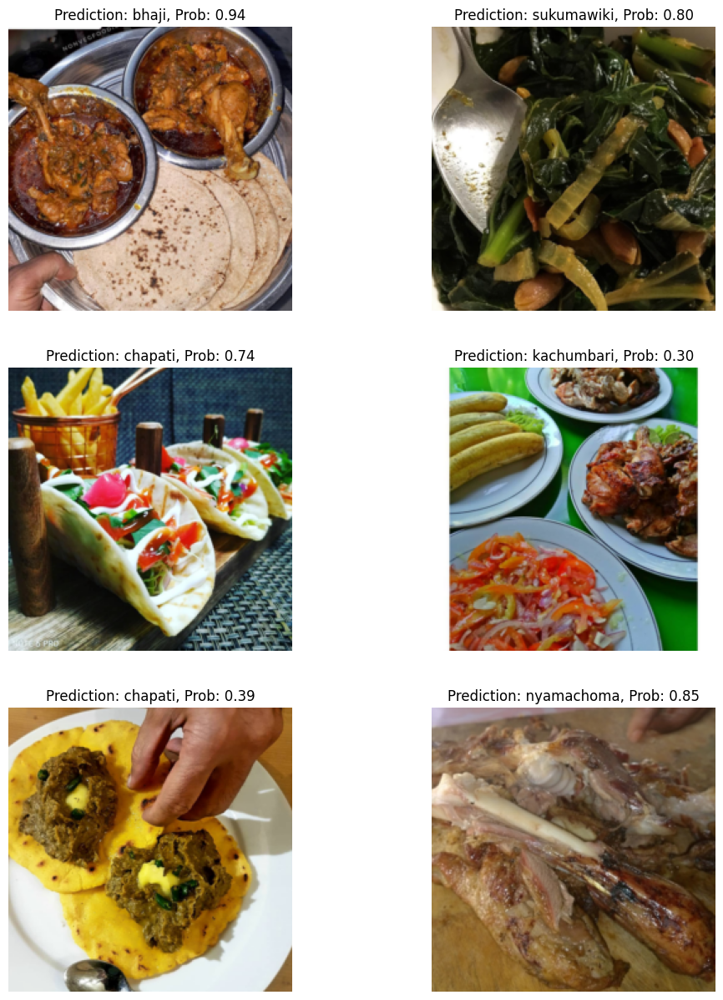

PREDICTIONS
[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 4, 1, 0, 0, 0, 4, 1, 0, 0, 3, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 12, 10, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 11, 0, 0, 0, 7, 0, 0, 1, 0, 0, 0, 3, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 3, 0, 0, 1, 5, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 9, 1, 1, 1, 1, 1, 1, 1, 1, 10, 1, 1, 1, 9, 1, 1, 1, 1, 5, 1, 1, 1, 1, 6, 1, 5, 1, 1, 1, 1, 1, 1, 1, 1, 1, 7, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 5, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 11, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 2, 0, 1, 1, 0, 1, 7, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 5, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2

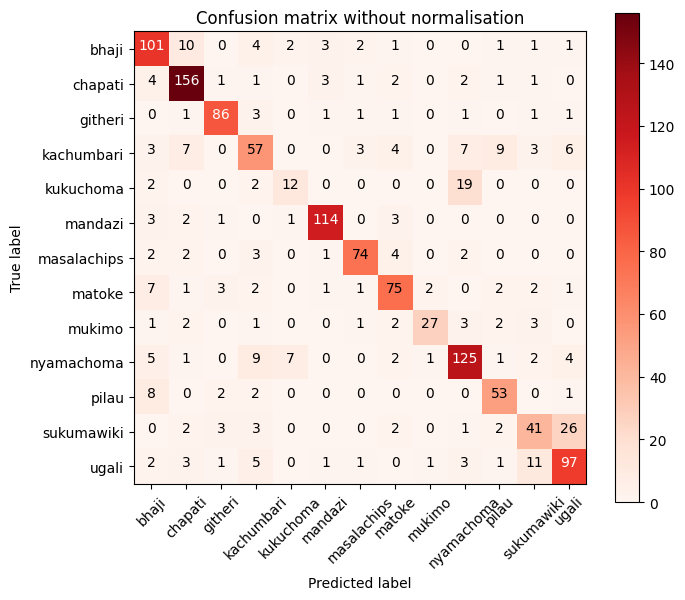

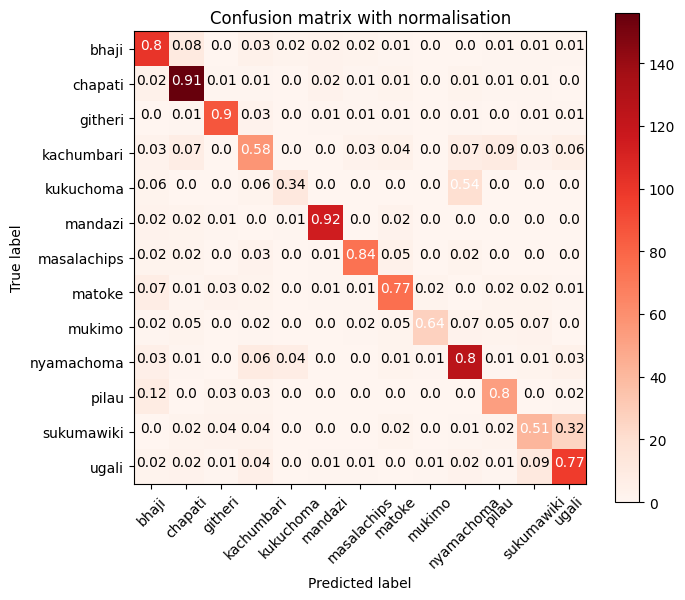

In [139]:
# validate prediction
validate_prediction(model, data_module, ckpt_path)

PREDICTIONS
[9, 1, 1, 2, 12, 3, 1, 12, 11, 6, 5, 2, 5, 12, 7, 0, 10, 0, 12, 9, 5, 2, 1, 9, 1, 10, 10, 8, 7, 6, 11, 12, 7, 11, 7, 6, 10, 1, 1, 1, 2, 11, 7, 0, 10, 6, 3, 5, 5, 5, 1, 5, 12, 7, 4, 9, 10, 5, 8, 7, 4, 0, 12, 12, 0, 0, 11, 11, 6, 1, 4, 8, 11, 3, 1, 3, 2, 9, 12, 11, 9, 1, 7, 9, 4, 9, 0, 12, 12, 6, 0, 3, 7, 0, 1, 0, 9, 12, 3, 7, 9, 1, 1, 3, 3, 5, 2, 0, 1, 5, 8, 9, 6, 12, 0, 1, 9, 2, 4, 2, 12, 11, 6, 11, 0, 5, 9, 5, 0, 5, 9, 9, 7, 2, 10, 3, 2, 9, 3, 1, 2, 1, 12, 9, 4, 9, 4, 5, 2, 1, 9, 0, 6, 1, 1, 10, 12, 6, 12, 1, 10, 5, 5, 12, 12, 2, 6, 6, 0, 5, 7, 12, 3, 2, 1, 7, 5, 2, 0, 9, 8, 7, 11, 1, 7, 0, 5, 5, 6, 12, 0, 9, 1, 12, 1, 7, 2, 9, 10, 9, 7, 1, 1, 6, 5, 0, 7, 9, 0, 2, 10, 1, 0, 10, 0, 1, 9, 12, 6, 1, 2, 1, 11, 10, 3, 5, 8, 1, 5, 7, 2, 11, 7, 7, 11, 0, 9, 2, 2, 12, 7, 9, 0, 12, 9, 1, 4, 8, 5, 1, 0, 12, 9, 11, 12, 3, 7, 7, 5, 7, 3, 11, 10, 3, 9, 9, 3, 3, 2, 1, 7, 7, 9, 12, 12, 2, 10, 0, 2, 7, 11, 1, 8, 9, 9, 5, 9, 10, 12, 5, 2, 8, 9, 1, 9, 5, 5, 9, 12, 7, 0, 9, 0, 3, 1, 5, 0, 11

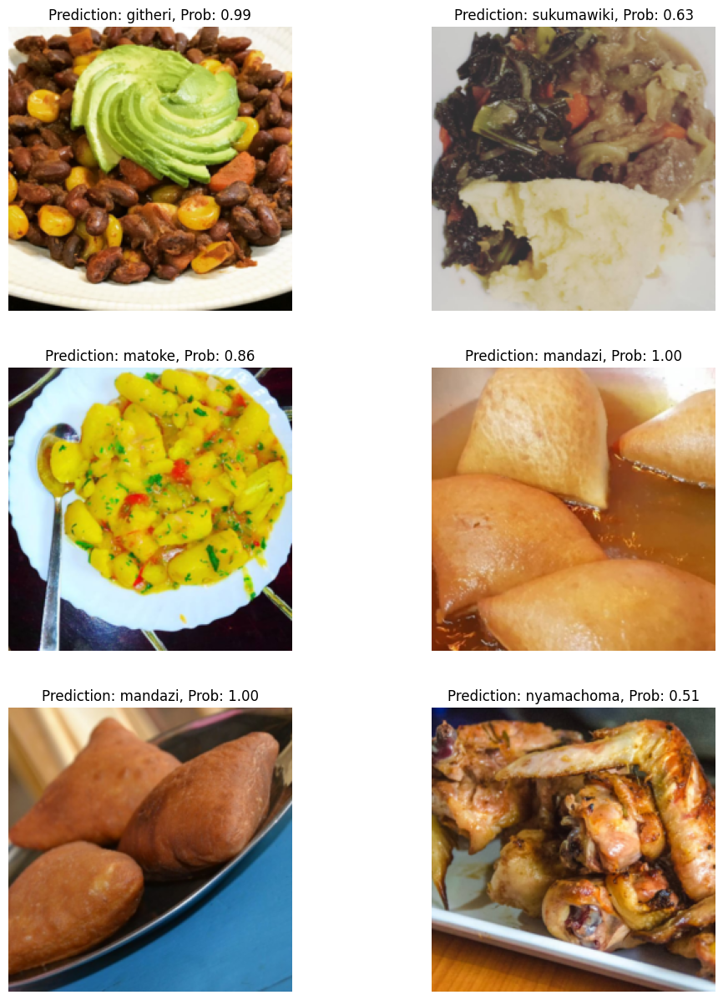

Data has been written to /content/drive/MyDrive/DLPT/Project2/submission.csv


In [156]:
# test prediction
test_prediction(model, data_module, ckpt_path)

## <font style="color:green">8. TensorBoard Log [5 Points]</font>

**Share your TensorBoard scalars logs here You can also share (not mandatory) your GitHub link, if you have pushed this project in GitHub.**


<font style="color:red">Note:</font> In light of the recent shutdown of tensorboard.dev, we have updated the submission requirements for your project. Instead of sharing a tensorboard.dev link, you are now required to upload your generated TensorBoard event files directly onto the lab. As an alternative, you may also include a screenshot of your TensorBoard output within your Jupyter notebook. This adjustment ensures that your data visualization and model training efforts are thoroughly documented and accessible for evaluation.

https://github.com/EagleDad/DEEP-LEARNING-WITH-PYTORCH/tree/master/applications/kaggleCompetitionClassification

## <font style="color:green">9. Kaggle Profile Link [50 Points]</font>

**Share your Kaggle profile link  with us here to score , points in  the competition.**

**For full points, you need a minimum accuracy of `75%` on the test data. If accuracy is less than `70%`, you gain  no points for this section.**


**Submit `submission.csv` (prediction for images in `test.csv`), in the `Submit Predictions` tab in Kaggle, to get evaluated for  this section.**

https://www.kaggle.com/dirkadler